In [1]:
import folium
from folium.features import (WmsTileLayer, RegularPolygonMarker, Vega, GeoJson,
                       CircleMarker, LatLngPopup,
                       ClickForMarker, TopoJson, PolyLine, MultiPolyLine,
                       )

import pandas as pd
dir_path=r'/Users/yuwu/Desktop/UIUC/MP/OutPut/'
Queen_avespeed_JJA_910_weekday = pd.read_csv(dir_path+'Queen_avespeed_JJA_910_weekday.csv')
links=pd.read_csv('sorted_links.csv')
#MHT_indexcsv=pd.read_csv(dir_path+'upper_east.csv')

In [4]:
Queen_avespeed_JJA_910_weekday[Queen_avespeed_JJA_910_weekday['link_id']==51]

,link_id,average_speed


In [2]:
Queen_avespeed_JJA_910_weekday

,link_id,average_speed
0,180225,6.831704
1,180226,11.680729
2,240300,7.972204
3,218771,6.958954
4,155650,10.986131
5,11,4.559357
6,218456,7.911911
7,147469,4.802369
8,139267,3.607726
9,65551,5.541413


In [7]:
Queen_ids=list(Queen_avespeed_JJA_910_weekday['link_id'])
Queen_ids.sort()
Queen_index=[i-1 for i in Queen_ids]
len(Queen_index)

10276

In [8]:
finrange=[ Queen_avespeed_JJA_910_weekday[Queen_avespeed_JJA_910_weekday['link_id']==i]['average_speed'].values[0] for i in Queen_ids if Queen_avespeed_JJA_910_weekday[Queen_avespeed_JJA_910_weekday['link_id']==i]['average_speed'].values]
min(finrange),max(finrange)

(0.30865225162400001, 30.000065957399997)

In [9]:
dic_ave={}
for ids in Queen_ids:
    temp=Queen_avespeed_JJA_910_weekday['average_speed'][Queen_avespeed_JJA_910_weekday['link_id']==ids].values
    if temp:
        dic_ave[ids-1]=[temp[0]]

In [10]:
len(dic_ave)

10276

In [11]:
crits=list(range(31))
crits=[31-i for i in crits]
crits+=[0.3]
#for i in [9,8,7,6,5,4,3,2,1]:
#    for j in [0.2,0.4,0.6,0.8]:
#        crits+=[i+j]
crits.sort(reverse=True)
crits

[31,
 30,
 29,
 28,
 27,
 26,
 25,
 24,
 23,
 22,
 21,
 20,
 19,
 18,
 17,
 16,
 15,
 14,
 13,
 12,
 11,
 10,
 9,
 8,
 7,
 6,
 5,
 4,
 3,
 2,
 1,
 0.3]

## Count weakly connected components

In [12]:
def filter_nolessthan(threshold):
    ql_list=[]
    for kee in dic_ave.keys():
        if (dic_ave[kee][0] >= threshold):
            ql_list+=[kee]
    return ql_list
def intersect(a, b):
    return list(set(a) & set(b))

In [13]:
def re_process(re_link,re_ids):
    l=int(re_link)
    m=list(re_ids)
    if not m:    
        return m #END1: exhaust source
    linked=list(find_linked(l,m))
    #print ("linked in re"+str(linked))
    if not linked: 
        return m   #END2: reach the end
    for ele in linked:
        m.remove(ele)
    #print (m)    
    for ele in linked:
        m=list(re_process(ele,m))
    return m #RECURSION: return the left linkids


def find_linked(m_link, m_ids):
    #m_link: the start link
    #m_matrix: the current new_matrix
    target_id=int(m_link)
    m=list(m_ids)
    linked_links=[]
    targetid_nodes=list(links[['begin_node_id','end_node_id']][links['link_id']==(target_id+1)].values[0])
    node_0=targetid_nodes[0]
    node_1=targetid_nodes[1]
    
    contain_0_begin=list(links['link_id'][links['begin_node_id']==node_0].values)
    contain_0_end=list(links['link_id'][links['end_node_id']==node_0].values)
    contain_1_begin=list(links['link_id'][links['begin_node_id']==node_1].values)
    contain_1_end=list(links['link_id'][links['end_node_id']==node_1].values)
    
    contain_either= list(set(contain_0_begin)|set(contain_0_end)|set(contain_1_begin)|set(contain_1_end))

    contain_either=[(i-1) for i in contain_either]

    return intersect(contain_either,m)         ####!!!!intersection of m and linked 

    

def count_component(criteria):
    #err=criteria
    threshold=criteria


    qualified_linkids=list(filter_nolessthan(threshold)) #for decrease
    
    previous_linkids=list(qualified_linkids)
    
    number_qualifiedlinks=len(qualified_linkids)
    components_weak=[]
    
    count_morn=0 #mornitor
    while (True):
        
        if not qualified_linkids: break

        firstlink=qualified_linkids[0]
        #print ("firstlink: "+str(firstlink))
        qualified_linkids.remove(firstlink)
        qualified_linkids = list(re_process(firstlink,qualified_linkids))

        #if count_morn%1000==0: print (len(qualified_linkids))#mornitor the process
        count_morn+=1
        
        
        for i in range(len(qualified_linkids)):
            previous_linkids.remove(qualified_linkids[i])
            
        components_weak += [list(previous_linkids)]
        previous_linkids = list(qualified_linkids)
            



    #print ("err "+str(err)+" FINAL count:  "+str(count)+" out of "+str(n_oklinks)+" qualified links")
    
    return number_qualifiedlinks,len(components_weak),components_weak

In [16]:
import sys
sys.setrecursionlimit(10000)

count_result=[]  #[i]:[error, qualified, component]
for j in log_progress(range(len(crits)),every=1):
    
    print("Start"+str(crits[j]))
    number_qual, number_comp, setofcomponents=count_component(crits[j]) #setofcomponents = [links in comp1,links in comp2]
    count_result=count_result+[[crits[j], number_qual, number_comp, setofcomponents]]
    print (number_comp)

Start31
0
Start30
35
Start29
38
Start28
40
Start27
40
Start26
44
Start25
49
Start24
54
Start23
56
Start22
60
Start21
66
Start20
76
Start19
89
Start18
98
Start17
117
Start16
136
Start15
146
Start14
173
Start13
196
Start12
209
Start11
186
Start10
173
Start9
142
Start8
123
Start7
93
Start6
68
Start5
23
Start4
10
Start3
7
Start2
5
Start1
5
Start0.3
4


## Barcode

In [18]:
def new_bar(start_err,end_err,links,status=True):
    return [[start_err,end_err,links,status]]

def link_in_which_component(link,sets):
    #return int: the link is in the (int)-th set
    for i in range(len(sets)):
        if link in sets[i]: 
            return i
    #if this link is not in any of sets
    print ("Error: the old qualified link is not in the new component !")
    return -1
    
def locate_link_in_barcode(link,bars):
    for i in range(len(bars)):
        if (link in bars[i][2]) & (bars[i][3]): 
            return i
    #if this link is not in any of activated barcode
    print ("Error: the old qualified link is not in the new component !")
    print ("!!! the missing link: "+str(link))
    return -999

In [19]:
#step=-0.1

#[start_err,end_err,component,activate status]

barcode=[]
#for j in range(0,6): #test
for j in log_progress(range(len(crits)),every=1):   # each error
    
    current_err=count_result[j][0] #float
    if j != len(crits)-1:
        end_err=count_result[j+1][0]
    else:
        end_err=current_err
    print("----------Criteria: "+str(current_err))
    num_comps=count_result[j][2]   #int
    if  num_comps!= 0:      #
        components_set=list(count_result[j][3])
         

        if not barcode: #empty barcode
            for i in range(num_comps):
                barcode=barcode+new_bar(start_err=current_err,end_err=end_err,links=list(components_set[i]))
            print ("create the first bar")
        else: #some bars in barcode

            previous_num_comps=count_result[j-1][2]
            old_compset=list(count_result[j-1][3])
            new_compset=list(count_result[j][3])

            old_represents=[]
            #select 1 represent from each component in previous error
            for k in range(previous_num_comps):
                pos=link_in_which_component(link=old_compset[k][0],sets=list(new_compset))
                old_represents=old_represents+[[old_compset[k][0],pos]]

            #calculate in each new comp, what old represent in it  and its bar_pos
            #[[0, [bar_pos]],[1,[bar_pos], ... ]
            oldbarpos_innewcomp=[[i,[]] for i in range(len(new_compset))]
            for s in range(previous_num_comps):
                temp_newpos=link_in_which_component(link=old_compset[s][0],sets=list(new_compset))
                temp_barpos=locate_link_in_barcode(link=old_represents[s][0],bars=list(barcode))
                oldbarpos_innewcomp[temp_newpos][1] += [temp_barpos]
                
            for x in oldbarpos_innewcomp:
                if not x[1]:   #bar_pos is empty
                    barcode=barcode+new_bar(start_err=current_err,end_err=end_err,links=list(new_compset[x[0]]))
                    print("add new bar:"+str(new_compset[x[0]]))
                elif len(x[1])==1:
                    indexofbar=x[1][0]
                    barcode[indexofbar][1]=end_err  #update end
                    barcode[indexofbar][2]=list(new_compset[x[0]])
                    print("update barcode"+str(indexofbar))
                else:
                    indecies=x[1]
                    toprolong = min(int(ah) for ah in indecies) #prolong the oldest
                    if barcode[toprolong][3]: #activated
                        barcode[toprolong][1]=end_err  #update end
                        barcode[toprolong][2]=list(new_compset[x[0]])
                        print("prolong barcode"+str(toprolong))
                    else:
                        print("??? MAYBE SOMETHING WRONG")  # maybe delete the code later
                        
                        
                    for ind in indecies:
                        if ind != toprolong:
                            barcode[ind][3]=False #deactivate this bar
                            print("deactivate barcode"+str(ind))
                    
            
            
          

----------Criteria: 31
----------Criteria: 30
create the first bar
----------Criteria: 29
update barcode0
add new bar:[66012]
update barcode1
update barcode2
update barcode3
prolong barcode4
deactivate barcode22
deactivate barcode23
deactivate barcode30
update barcode26
update barcode5
update barcode6
add new bar:[118788]
update barcode7
update barcode8
update barcode9
update barcode10
prolong barcode11
deactivate barcode12
update barcode13
update barcode14
add new bar:[234468]
update barcode15
update barcode16
update barcode20
update barcode17
update barcode18
update barcode19
update barcode21
add new bar:[75206]
update barcode24
update barcode25
update barcode27
update barcode28
update barcode29
update barcode31
add new bar:[95141]
update barcode32
add new bar:[62990]
update barcode33
update barcode34
add new bar:[158370]
----------Criteria: 28
update barcode0
update barcode35
update barcode1
update barcode2
update barcode3
update barcode4
update barcode26
update barcode5
add new bar

## Plot barcode

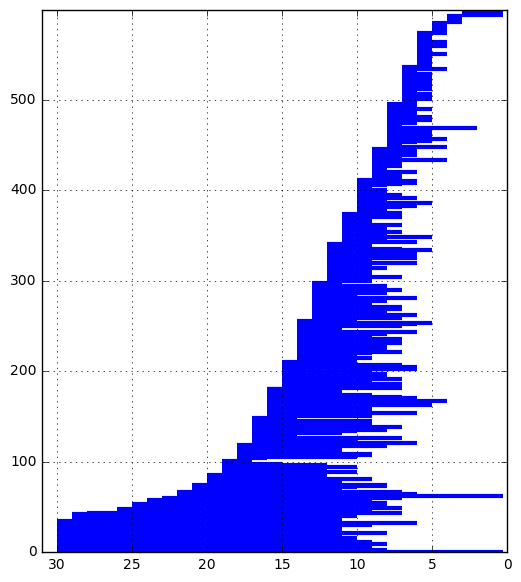

In [21]:
import numpy as np
import matplotlib.pyplot as plt
dir_path=r'/Users/yuwu/Desktop/UIUC/MP/OutPut/Queen/'
fig0=plt.figure(figsize=(6, 7))
y = [(i+1) for i in range(len(barcode))]
x = [(barcode[i][1]+barcode[i][0])/2 for i in range(len(barcode))]
x_err = [(barcode[i][1]-barcode[i][0])/2 for i in range(len(barcode))]

for k in range(len(barcode)):
    _, caps, _ = plt.errorbar(x=x[k], y=y[k], xerr=x_err[k], ls='', elinewidth=3, capsize=5,color='blue') #color_bar[k%7]
    for cap in caps:
        cap.set_markeredgewidth(0)

plt.grid(True)

# Set the y-range so we can see all the errorbars clearly
plt.ylim(0, len(barcode)+1)
plt.xlim(31.0, 0)
plt.show()
#fig0.savefig(dir_path+'Barcode_Queen_JJA_910_nolessthan_blue.png',dpi=500)

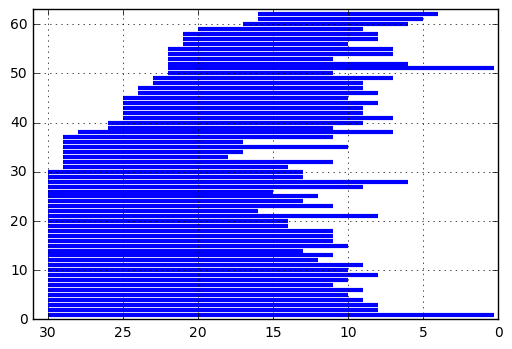

In [24]:
import numpy as np
import matplotlib.pyplot as plt
dir_path=r'/Users/yuwu/Desktop/UIUC/MP/OutPut/Queen/'
fig0=plt.figure()


x = [(barcode[i][1]+barcode[i][0])/2 for i in range(len(barcode)) if (barcode[i][0]-barcode[i][1])>10]
x_err = [(barcode[i][1]-barcode[i][0])/2 for i in range(len(barcode)) if (barcode[i][0]-barcode[i][1])>10]
y = [(i+1) for i in range(len(x))]

for k in range(len(x)):
    _, caps, _ = plt.errorbar(x=x[k], y=y[k], xerr=x_err[k], ls='', elinewidth=3, capsize=5,color='blue') #color_bar[k%7]
    for cap in caps:
        cap.set_markeredgewidth(0)

plt.grid(True)

# Set the y-range so we can see all the errorbars clearly
plt.ylim(0, len(x)+1)
plt.xlim(31.0, 0)
plt.show()
#fig0.savefig(dir_path+'Barcode_Queen_JJA_910_nolessthan_blue_longer10.png',dpi=500)

In [43]:
import time
from selenium import webdriver
dir_path=r'/Users/yuwu/Desktop/UIUC/MP/OutPut/Bor_UpperEast/figure/'

def save_map(m,filename,pngname):
    
    delay=2
    fn=filename
    tmpurl='file://'+dir_path+fn
    #tmpurl='file:///Users/yuwu/Desktop/UIUC/MP/RunningPlatform/Group2/13to96/{}'.format(fn)
    m.save(dir_path+fn)
    #use chrome driver, if you have not used it before, download it at https://sites.google.com/a/chromium.org/chromedriver/downloads
    #browser = webdriver.Chrome('C://Users//Price//chromedriver.exe')
    driver.get(tmpurl)
    #Give the map tiles some time to load
    time.sleep(delay)
    #take screenshot
    
    
    #driver.save_screenshot(dir_path+pngname)
    driver.get_screenshot_as_file(dir_path+pngname) 
    
    #browser.quit()

In [47]:
color_bar=['red','blue','green','purple','orange','skyblue','pink']
def find_color(onelink,curr_cri):
    desired_color=-1
    for i in range(len(barcode)):
        if (barcode[i][0] >= curr_cri) & (curr_cri > barcode[i][1]):
            if onelink in barcode[i][2]:
                desired_color=i
    if desired_color==-1:
        print('Wrong color')
        return 'black'
    return color_bar[desired_color%7]

In [58]:
chromedriver = "/Users/yuwu/Downloads/chromedriver-1"
driver = webdriver.Chrome(chromedriver)
dir_path=r'/Users/yuwu/Desktop/UIUC/MP/OutPut/Bor_UpperEast/figure/'

correctset=[0,1,20]
for i in range(len(crits)):
#for i in correctset:
    
    #NY_COORDINATES = (40.7580395,-73.9802535)
    NY_COORDINATES = (40.782053, -73.965533)
    m =folium.Map(location=NY_COORDINATES, tiles='cartodbpositron',zoom_start=13) #'openstreetmap','cartodbpositron'



    #qualified_index=filter_nolessthan(crits[crit])
    #num_ql, num_comp , components_link =count_component(crits[crit])
    num_ql, num_comp , components_link =count_result[i][1:]


    #index_list=list(test)





    '''for linkindex in index_list:
            coords=links[['startY','startX','endY','endX']].values[linkindex]
            loc=[[coords[0],coords[1]],[coords[2],coords[3]]]            
            m.add_children(PolyLine(locations=loc,weight=5,color='red'))

    if qualified_index:
            #for key_linkid in log_progress(qualified_index,every=1):
            for key_linkid in qualified_index:
                coords=links[['startY','startX','endY','endX']].values[key_linkid]
                loc=[[coords[0],coords[1]],[coords[2],coords[3]]]            
                m.add_children(PolyLine(locations=loc,weight=5,color='grey'))'''
    if components_link:
        for order in range(len(components_link)):
            one_comp=components_link[order]
            #color=find_color(one_comp[0],crits[crit])
            #color=color_bar[order]
            for key_ind in one_comp:
                coords=links[['startY','startX','endY','endX']].values[key_ind]
                loc=[[coords[0],coords[1]],[coords[2],coords[3]]]            
                m.add_children(PolyLine(locations=loc,weight=3,color='red'))        


    filename='MHT_avespeed>={}.html'.format(crits[i])
    pngname='MHT_avespeed>={}.png'.format(crits[i]) 
                            
    save_map(m,filename,pngname)

driver.quit()

In [52]:
m #31 30 19

In [26]:


correctset=[31]
#for i in range(len(crits)):
for i in correctset:
    
    #NY_COORDINATES = (40.7580395,-73.9802535)
    NY_COORDINATES = (40.782053, -73.965533)
    m =folium.Map(location=NY_COORDINATES, tiles='cartodbpositron',zoom_start=11) #'openstreetmap','cartodbpositron'



    #qualified_index=filter_nolessthan(crits[crit])
    #num_ql, num_comp , components_link =count_component(crits[crit])
    num_ql, num_comp , components_link =count_result[i][1:]


    #index_list=list(test)


    if components_link:
        for order in range(len(components_link)):
            one_comp=components_link[order]
            #color=find_color(one_comp[0],crits[crit])
            #color=color_bar[order]
            for key_ind in one_comp:
                coords=links[['startY','startX','endY','endX']].values[key_ind]
                loc=[[coords[0],coords[1]],[coords[2],coords[3]]]            
                m.add_children(PolyLine(locations=loc,weight=3,color='red'))        



In [27]:
m

In [36]:
len(count_result[31][3][3])

3

In [15]:
def log_progress(sequence, every=None, size=None):
    from ipywidgets import IntProgress, HTML, VBox
    from IPython.display import display

    is_iterator = False
    if size is None:
        try:
            size = len(sequence)
        except TypeError:
            is_iterator = True
    if size is not None:
        if every is None:
            if size <= 200:
                every = 1
            else:
                every = int(size / 200)     # every 0.5%
    else:
        assert every is not None, 'sequence is iterator, set every'

    if is_iterator:
        progress = IntProgress(min=0, max=1, value=1)
        progress.bar_style = 'info'
    else:
        progress = IntProgress(min=0, max=size, value=0)
    label = HTML()
    box = VBox(children=[label, progress])
    display(box)

    index = 0
    try:
        for index, record in enumerate(sequence, 1):
            if index == 1 or index % every == 0:
                if is_iterator:
                    label.value = '{index} / ?'.format(index=index)
                else:
                    progress.value = index
                    label.value = u'{index} / {size}'.format(
                        index=index,
                        size=size
                    )
            yield record
    except:
        progress.bar_style = 'danger'
        raise
    else:
        progress.bar_style = 'success'
        progress.value = index
        label.value = str(index or '?')